## Dice-Sorensen-Koef

Der Dice-Koeffizient (DSC) misst, wie ähnlich zwei Bereiche (oder Segmentierungen) in einem Bild sind. Man kann ihn sich vorstellen als:

$$ DSC = \frac{2|A \cap B|}{|A| + |B|} $$

wobei,
- $A$ die Menge der Pixel im ersten Segmentierungsergebnis
- $|A|$ die Anzahl der Elemente (Pixel) in Menge $A$ ist.


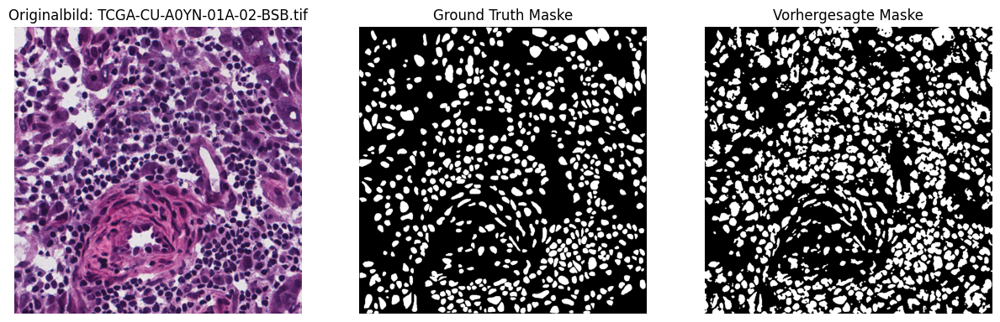

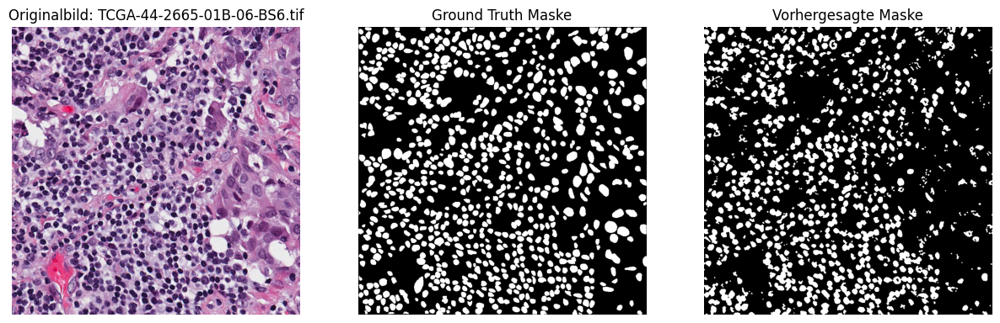

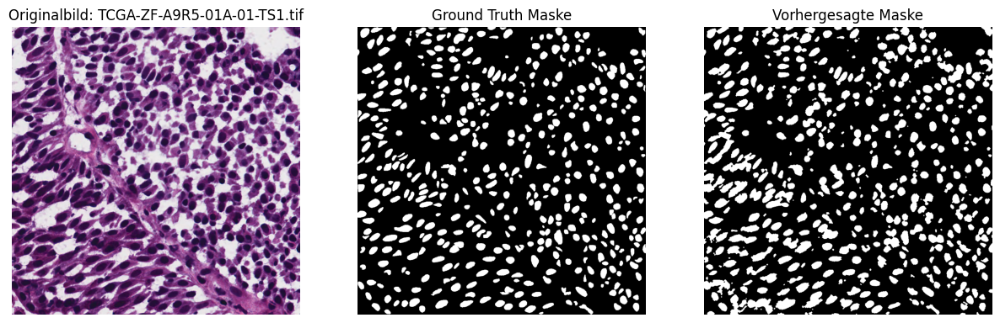

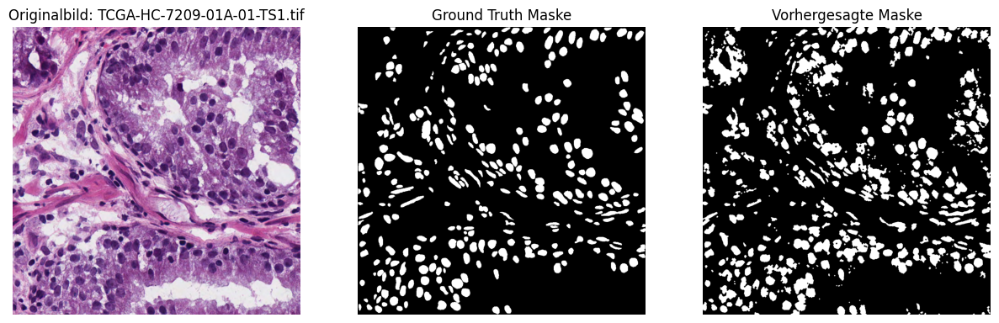

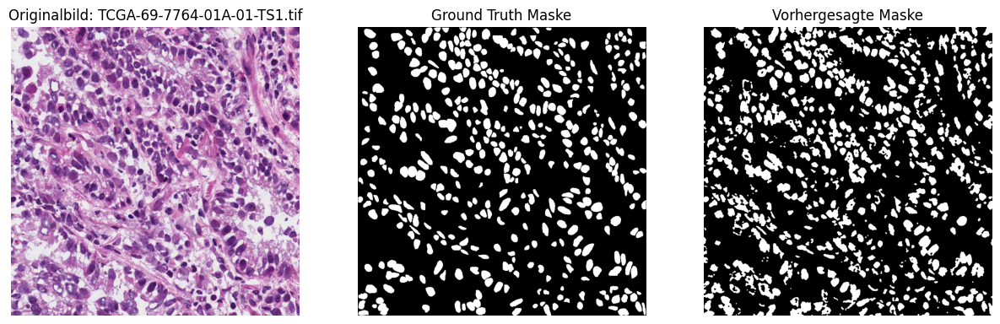

...

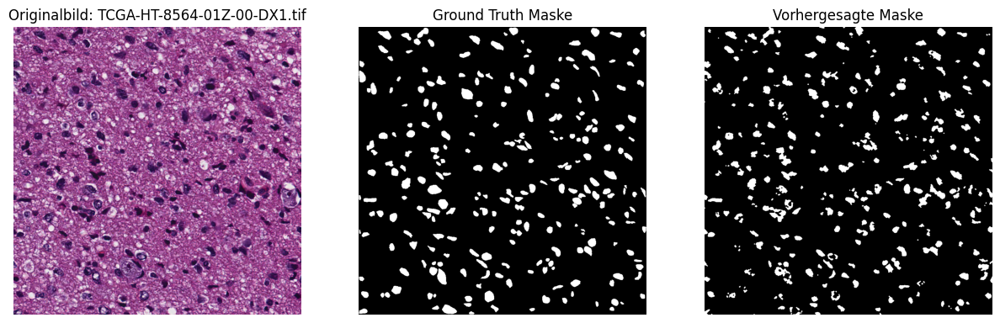

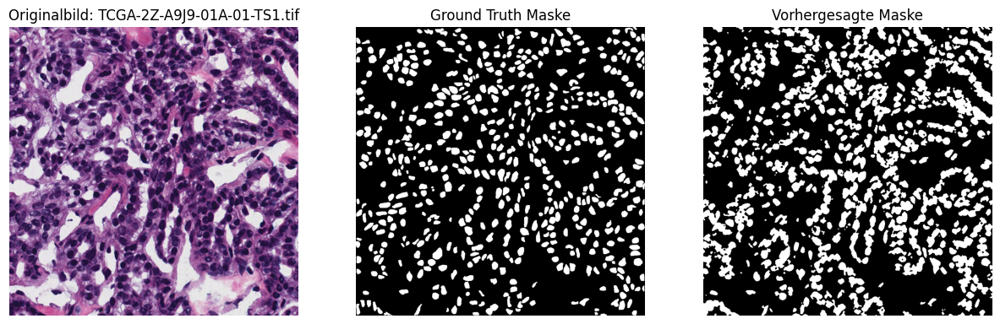

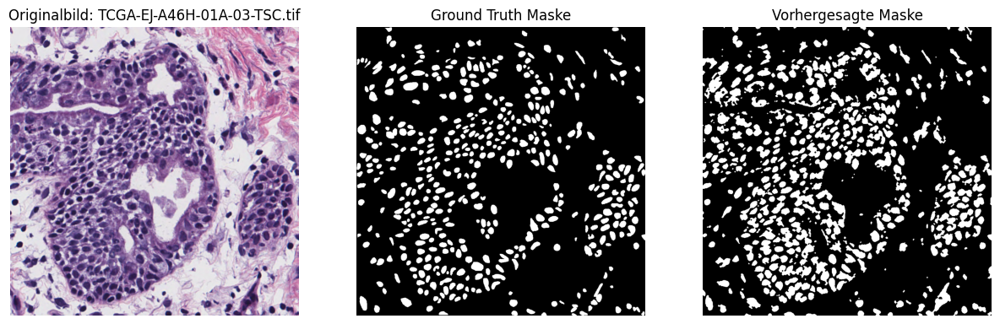

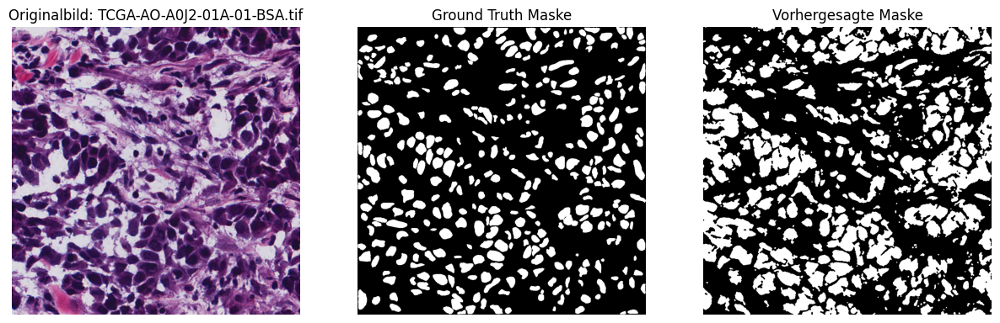

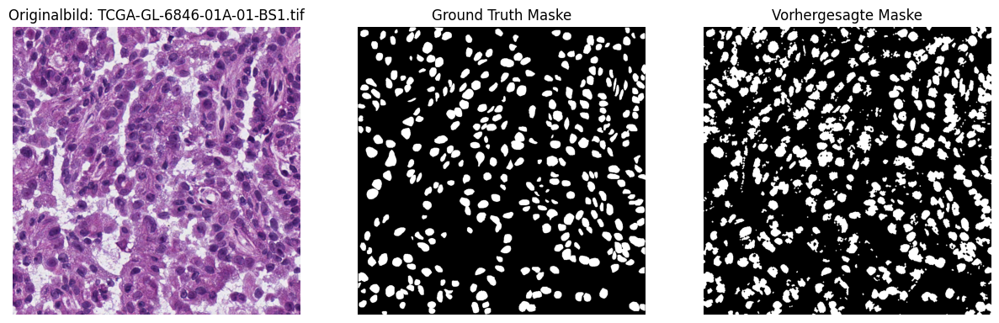

In [ ]:
from skimage import io
from skimage.color import rgb2hed
from skimage.morphology import opening, closing, disk
from skimage.filters import threshold_otsu
import os
import matplotlib.pyplot as plt
import numpy as np

test_path = "/data/test"
# Funktion zur Berechnung des Dice-Koeffizienten
def dice_coefficient(y_true, y_pred):
    y_true = y_true > 0
    y_pred = y_pred > 0
    intersection = np.sum(y_true * y_pred)  # Berechne die Schnittmenge der Masken
    # Berechne den Dice-Koeffizienten
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred))

test_images = [f for f in os.listdir(test_path) if f.endswith('.tif') and '_mask' not in f]
dice_scores = []
for image_name in test_images:
    image_path = os.path.join(test_path, image_name)
    image = io.imread(image_path)
    #Hämatozyklin, Eosin, DAB (HED) Farbraum
    hed_image = rgb2hed(image)
    hematoxylin_channel = hed_image[:, :, 0]  # Fokus auf den Hämatozyklin-Kanal
    thresh = threshold_otsu(hematoxylin_channel) # Otsus Schwellenwertverfahren
    binary_mask = hematoxylin_channel > thresh

    selem = disk(2)  # Scheibenförmiges Strukturelement
    binary_mask = closing(opening(binary_mask, selem), selem) # morphologische Operationen

    # Lese die entsprechende Ground-Truth-Maske ein
    mask_name = image_name.replace('.tif', '_mask.tif')
    ground_truth_mask = io.imread(os.path.join(test_path, mask_name))
    # Stelle sicher, dass die Ground-Truth-Maske binär ist
    ground_truth_mask = ground_truth_mask > 0

    # Berechne den Dice-Koeffizienten
    dice_score = dice_coefficient(ground_truth_mask, binary_mask)
    dice_scores.append(dice_score)

    # Visualisiere das Originalbild, die Ground-Truth-Maske und die vorhergesagte Maske
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(image)
    ax[0].set_title(f'Originalbild: {image_name}')
    ax[0].axis('off')

    ax[1].imshow(ground_truth_mask, cmap='gray')
    ax[1].set_title(f'Ground Truth Maske')
    ax[1].axis('off')

    ax[2].imshow(binary_mask, cmap='gray')
    ax[2].set_title(f'Vorhergesagte Maske')
    ax[2].axis('off')

    plt.show()

In [57]:
average_dice = np.mean(dice_scores)
print(f'Durchschnittlicher Dice-Koeffizient über alle Testbilder: {average_dice}')

Durchschnittlicher Dice-Koeffizient über alle Testbilder: 0.7692703600988944
